# Introduction:
In this study, I conducted a thorough analysis of a dataset comprising 90 distinct animal images, aiming to explore various classification tasks. The primary goal is to organize the data for one-vs-rest binary classification and tackle a more complex 5-class classification challenge with a k-fold cross validation. The assessment of these classification models involves utilizing classification matrices to provide a comprehensive evaluation.

# Libraries

Importing the necessary libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset

In [2]:
import os 
import shutil
import random
from PIL import Image

The code then retrieves and prints the width and height of the opened image using the `size` attribute. The values are displayed in the format "width: {width}, height: {height}". This information provides the dimensions of the image in terms of its width and height, aiding in understanding the spatial characteristics of the visual content.

In [3]:
path = "/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/antelope/02f4b3be2d.jpg"
image = Image.open(path)
width, height = image.size
print(f"width: {width}, height: {height}")

width: 1640, height: 1025


Analysing the dataset

The images are resized to (224, 224) pixels and converted to tensors as part of the preprocessing steps.

In [4]:
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

animal_dataset = '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals'

dataset = ImageFolder(root=animal_dataset, transform=transform)

batch_size = 32
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

num_classes = len(dataset.classes)
dataset_size = len(dataset)
print(f"Number of classes: {num_classes}")
print(f"Dataset size: {dataset_size}")

for batch in data_loader:
    images, labels = batch

Number of classes: 90
Dataset size: 5400


**Tensor to Image Conversion:**
The `tensor_to_image` function is defined to convert PyTorch tensors to NumPy arrays for visual representation. It adjusts the tensor dimensions to be compatible with Matplotlib and normalizes pixel values to the range [0, 1].

**Batch Image Display:**
The code then displays images from a batch using Matplotlib. It creates a subplot with a specified number of columns, and for each image in the batch, it converts the PyTorch tensor to a NumPy array, normalizes it, and displays it along with its corresponding class label as the title. The axis is turned off for a cleaner visual output.

Overall, this code snippet facilitates the convenient visualization of a subset of images from a batch, aiding in the inspection of input data and associated class labels.

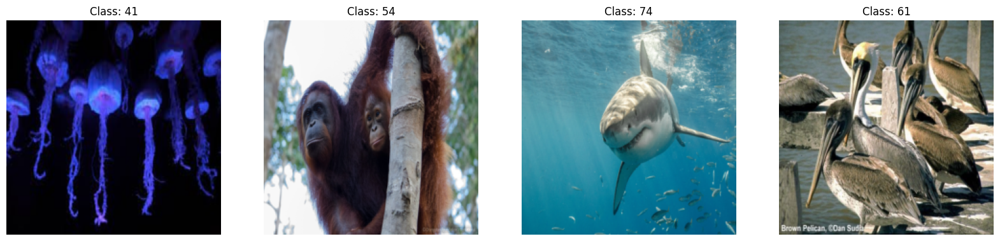

In [5]:
def tensor_to_image(tensor):
    img = tensor.permute(1, 2, 0).numpy()
    img = (img - img.min()) / (img.max() - img.min())
    return img

fig, ax = plt.subplots(ncols=4, figsize=(20, 20))

for idx in range(4):  
    image, label = batch[0][idx], batch[1][idx]
    img_np = tensor_to_image(image)
    ax[idx].imshow(img_np)
    ax[idx].set_title(f"Class: {label.item()}")
    ax[idx].axis('off')

plt.show()

# One-vs-Rest (OvR) classification:

One-vs-Rest (OvR) classification is a strategy where a multi-class classification problem is transformed into multiple binary classification tasks. In OvR, a separate classifier is trained for each class, treating that class as the positive class while combining all other classes into a single negative class. This results in multiple binary classifiers, each specializing in distinguishing one class from the rest. During prediction, the class with the highest confidence among the individual classifiers is assigned as the final predicted class. OvR is commonly used when dealing with multi-class classification problems in machine learning. The dataset underwent analysis utilizing CustomNN architecture.

In [6]:
path = "/kaggle/input/animal-image-dataset-90-different-animals/animals/animals"

This code defines a custom dataset class, `CustomDataset`, for binary classification tasks. It is designed to be used with PyTorch's data loading utilities. The dataset is constructed by selecting images from specified folders based on the provided `data_idx`. The selected folder is designated as the positive class (`1`), while all other folders represent the negative class (`0`). The dataset is then transformed using image preprocessing techniques such as resizing, cropping, and normalization. During training, each image is paired with its corresponding label, and the dataset's length and item retrieval functions are implemented accordingly. This class allows for the creation of a custom dataset for binary image classification with PyTorch.

In [7]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data_idx, take=0.1, path=path):
        super().__init__()
        classes = os.listdir(path)
        folder_name = classes[data_idx]
        self.images = []
        self.labels = []
        self.transforms = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

        for folder in classes:
            limit = 1 if folder == folder_name else take
            anim_fold = os.path.join(path, folder)
            
            for l, localpath in enumerate(os.listdir(anim_fold)):
                if l >= limit * len(os.listdir(anim_fold)):
                    break
                
                img_path = os.path.join(anim_fold, localpath)
                self.images.append(img_path)
                self.labels.append(1 if folder == folder_name else 0)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.transforms(Image.open(self.images[idx])), torch.tensor(self.labels[idx], dtype=torch.long)

This code defines a function, `run_label_classification_one_vs_rest_fold`, for performing one-vs-rest binary classification using a provided PyTorch model. The function conducts k-fold cross-validation (k=3) for each animal class in the dataset, training and evaluating the model on different folds. It prints and saves accuracy curves and confusion matrices for each fold. The training process includes optimization with Adam, and the accuracy and loss metrics are recorded and visualized. The results are saved in specific directories for each animal class and fold, providing insights into the model's performance for one-vs-rest classification tasks.

In [8]:
with open("/kaggle/input/animal-image-dataset-90-different-animals/name of the animals.txt", 'r') as f:
    animal_info = f.read()

def run_label_classification_one_vs_rest_fold(model_net, name):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    name_model = str(name)

    for i in range(90):
        print(animal_info.split()[i])
        dataset = CustomDataset(i)

        kfold = KFold(n_splits=3, shuffle=True)

        print('--------------------------------')

        for fold, (train_ids, test_ids) in enumerate(kfold.split(dataset)):
            print(f'FOLD {fold}')
            print('--------------------------------')

            train_loader = DataLoader(dataset, batch_size=32, sampler=torch.utils.data.SubsetRandomSampler(train_ids), pin_memory=True, num_workers=2)
            test_loader = DataLoader(dataset, batch_size=32, sampler=torch.utils.data.SubsetRandomSampler(test_ids), pin_memory=True, num_workers=2)

            model = model_net
            model.to(device)

            optimizer = optim.Adam(model.parameters(), lr=5e-5)
            train_losses, test_losses, train_accuracies, test_accuracies = [], [], [], []

            for epoch in range(3):
                model.train()
                correct, total, train_loss = 0, 0, 0.0

                for _, (inputs, labels) in enumerate(train_loader):
                    inputs, labels = inputs.to(device), labels.to(device)
                    optimizer.zero_grad()
                    outputs = model(inputs)
                    loss = nn.CrossEntropyLoss()(outputs, labels)
                    loss.backward()
                    optimizer.step()
                    train_loss += loss.item()
                    _, predicted = outputs.max(1)
                    total += labels.size(0)
                    correct += predicted.eq(labels).sum().item()

                model.eval()
                test_loss, test_correct, test_total = 0.0, 0, 0
                all_labels, all_predictions = [], []

                for inputs, labels in test_loader:
                    inputs, labels = inputs.to(device), labels.to(device)
                    outputs = model(inputs)
                    loss = nn.CrossEntropyLoss()(outputs, labels)
                    test_loss += loss.item()*inputs.size(0)
                    _, predicted = outputs.max(1)
                    test_total += labels.size(0)
                    test_correct += predicted.eq(labels).sum().item()
                    all_labels.extend(labels.cpu().numpy())
                    all_predictions.extend(predicted.cpu().numpy())

                test_loss /= len(test_loader)
                train_loss /= len(train_loader)
                test_accuracy = 100.0 * correct / total
                train_accuracy = 100.0 * test_correct / test_total

                train_losses.append(train_loss)
                test_losses.append(test_loss)
                train_accuracies.append(train_accuracy)
                test_accuracies.append(test_accuracy)

                print('Epoch: {} \tTraining Loss: {:.6f} \tTest Loss: {:.6f} \tTrain Accuracy {:.6f}% \tTest Accuracy: {:.2f}%'.format(
                    epoch+1, train_loss, test_loss, train_accuracy, test_accuracy
                ))
                
            directory = f'/kaggle/working/one-vs-rest/{name}/{animal_info.split()[i]}/'
            os.makedirs(directory, exist_ok=True)

            plt.figure(figsize=(5, 4))
            plt.plot(train_accuracies, label='Train Accuracy')
            plt.plot(test_accuracies, label='Test Accuracy')
            plt.title(f'Accuracy Curve for Dataset Name: {animal_info.split()[i]} Fold {fold}')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.savefig(os.path.join(directory, f'{fold}.png'))

            print(f'Confusion Matrix for fold {fold}')
            print(confusion_matrix(all_labels, all_predictions))


This code defines a PyTorch neural network architecture, `CustomCNN`, which consists of convolutional layers, fully connected layers, and an attention mechanism. The attention mechanism is implemented as a separate module, `Attention`, which is integrated into the forward pass of `CustomCNN`. The model is designed for binary classification tasks with an output size of 2. Additionally, the function `run_label_classification_one_vs_rest_fold` is utilized to perform one-vs-rest binary classification using the provided model (`model_CustomCNN`). This function conducts k-fold cross-validation (k=3) for each animal class in the dataset, training and evaluating the `CustomCNN` model on different folds. Accuracy curves and confusion matrices are visualized and saved for each fold, providing insights into the model's performance for one-vs-rest classification tasks.

antelope
--------------------------------
FOLD 0
--------------------------------
Epoch: 1 	Training Loss: 0.862701 	Test Loss: 10.539944 	Train Accuracy 85.858586% 	Test Accuracy: 84.85%
Epoch: 2 	Training Loss: 0.300169 	Test Loss: 10.772852 	Train Accuracy 86.363636% 	Test Accuracy: 91.92%
Epoch: 3 	Training Loss: 0.207926 	Test Loss: 10.733144 	Train Accuracy 86.868687% 	Test Accuracy: 93.18%
Confusion Matrix for fold 0
[[170   0]
 [ 26   2]]
FOLD 1
--------------------------------
Epoch: 1 	Training Loss: 0.326886 	Test Loss: 5.856941 	Train Accuracy 91.919192% 	Test Accuracy: 88.64%
Epoch: 2 	Training Loss: 0.212647 	Test Loss: 5.263485 	Train Accuracy 92.424242% 	Test Accuracy: 91.41%
Epoch: 3 	Training Loss: 0.171747 	Test Loss: 5.647876 	Train Accuracy 92.424242% 	Test Accuracy: 92.93%
Confusion Matrix for fold 1
[[182   0]
 [ 15   1]]
FOLD 2
--------------------------------
Epoch: 1 	Training Loss: 0.163004 	Test Loss: 2.772707 	Train Accuracy 98.484848% 	Test Accuracy: 95.45

/tmp/ipykernel_34/2328467579.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5, 4))


Confusion Matrix for fold 2
[[178   0]
 [  0  20]]
boar
--------------------------------
FOLD 0
--------------------------------
Epoch: 1 	Training Loss: 0.410640 	Test Loss: 4.206645 	Train Accuracy 94.949495% 	Test Accuracy: 91.41%
Epoch: 2 	Training Loss: 0.138044 	Test Loss: 3.816497 	Train Accuracy 96.969697% 	Test Accuracy: 95.71%
Epoch: 3 	Training Loss: 0.096170 	Test Loss: 3.714560 	Train Accuracy 94.949495% 	Test Accuracy: 95.96%
Confusion Matrix for fold 0
[[167   5]
 [  5  21]]
FOLD 1
--------------------------------
Epoch: 1 	Training Loss: 0.152556 	Test Loss: 2.233560 	Train Accuracy 96.464646% 	Test Accuracy: 95.96%
Epoch: 2 	Training Loss: 0.062579 	Test Loss: 2.269689 	Train Accuracy 96.464646% 	Test Accuracy: 98.23%
Epoch: 3 	Training Loss: 0.039313 	Test Loss: 2.656792 	Train Accuracy 97.474747% 	Test Accuracy: 98.48%
Confusion Matrix for fold 1
[[178   2]
 [  3  15]]
FOLD 2
--------------------------------
Epoch: 1 	Training Loss: 0.071655 	Test Loss: 0.883222 	Tra

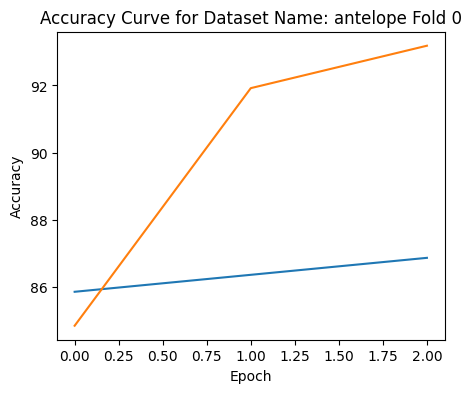

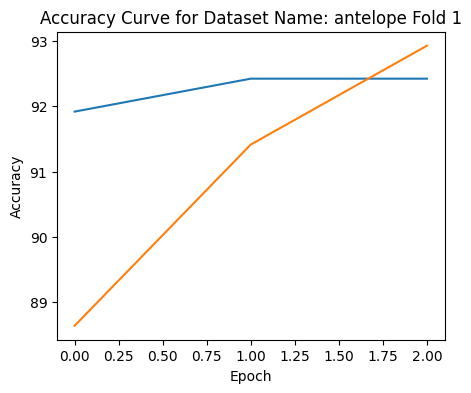

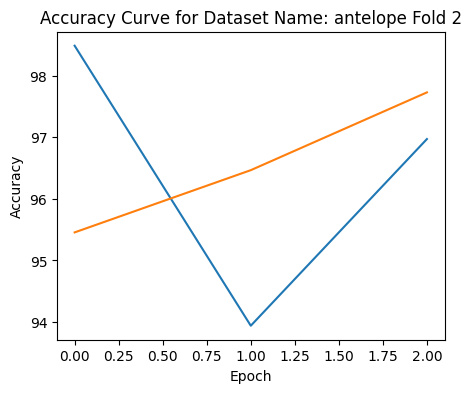

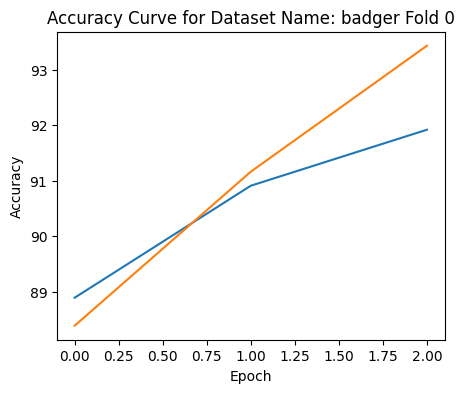

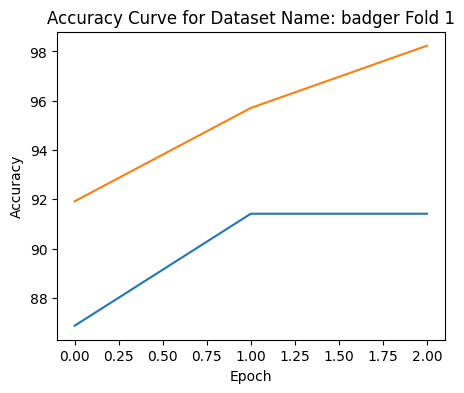

...

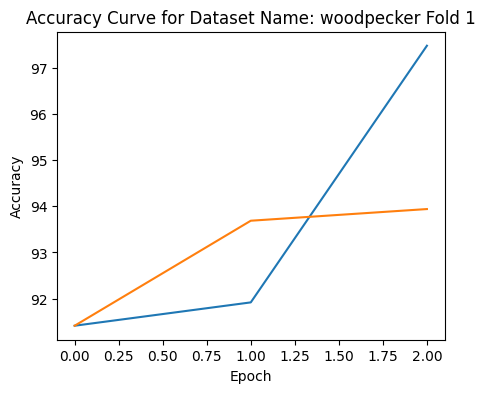

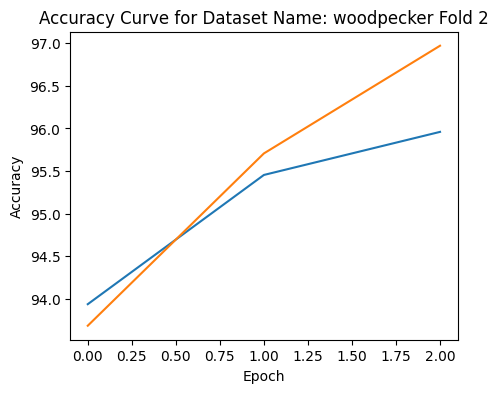

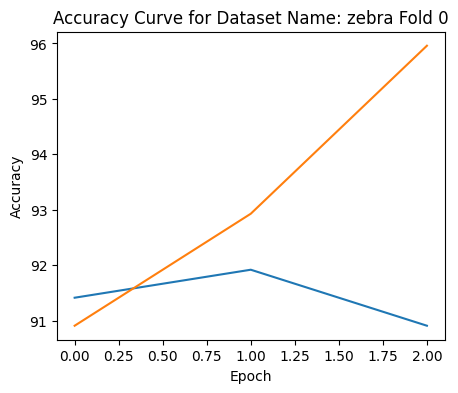

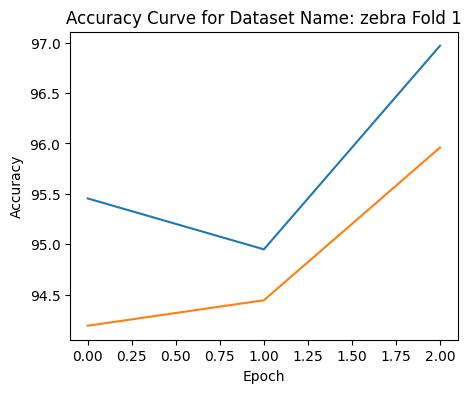

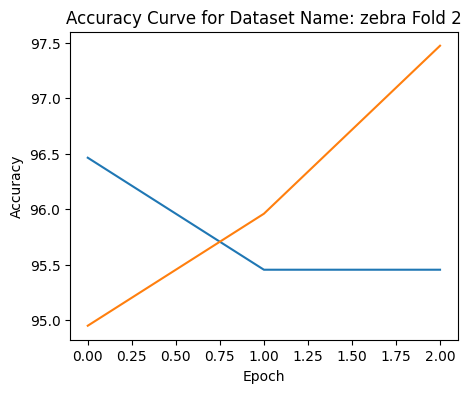

In [9]:
class Attention(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.attention = nn.Sequential(
            nn.Linear(in_features, in_features),
            nn.Tanh(),
            nn.Linear(in_features, 1),
            nn.Softmax(dim=1)
        )

    def forward(self, x):
        return self.attention(x) * x

class CustomCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.fc1 = nn.Linear(64*56*56, 1000) 
        self.attention = Attention(1000)
        self.fc2 = nn.Linear(1000, 2)

    def forward(self, x):
        x = F.max_pool2d(F.relu(self.conv1(x)), 2)
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        x = x.view(x.size(0), -1) 
        x = self.fc2(self.attention(F.relu(self.fc1(x))))
        return x

model_CustomCNN = CustomCNN()
run_label_classification_one_vs_rest_fold(model_CustomCNN, 'CustomCNN')


# 5-class classification:

Here, I performed a multi-class classification (k=5) which is a type of machine learning task where the goal is to categorize input data into one of five predefined classes or categories. In this scenario, the model is trained to recognize and distinguish between five distinct classes, each representing a different group or category. 

In [10]:
path = "/kaggle/input/animal-image-dataset-90-different-animals/animals/animals"

This code defines a custom PyTorch dataset class, `dataset_pent_class`, intended for a specific use case. The dataset is constructed for a multi-class classification problem where each class contains images from a specific category. The dataset is divided into windows of five consecutive classes, and the `start_idx` parameter specifies the starting index of the current window.

The dataset is initialized with the path to the dataset directory and a window size of 5. The dataset class loads images and corresponding labels based on the provided starting index and window size. The images are loaded using the specified transformations, including resizing, center cropping, and normalization. The labels are assigned based on the modulo operation to ensure each class within the window is uniquely labeled.

The `__len__` method returns the total number of images in the dataset, and the `__getitem__` method loads and transforms an image along with its corresponding label for a given index.

This dataset class is designed to be used in a PyTorch DataLoader to facilitate training and evaluation of neural network models for the specific multi-class classification problem described.

In [11]:
class dataset_pent_class(torch.utils.data.Dataset):
    def __init__(self,start_idx, path=path, window_size= 5):
        super().__init__()
        classes = os.listdir(path)
        self.images = []
        self.labels = []
        self.transforms = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ])
        end_idx = start_idx*5 + window_size
        for i in range(start_idx*5, end_idx):
            folder_name = classes[i] 
            anim_fold = os.path.join(path, folder_name)
            for localpath in os.listdir(anim_fold):
                img_path = os.path.join(anim_fold, localpath)
                self.images.append(img_path)
                self.labels.append(i % window_size)  
        
    def __len__(self):
        return len(self.images)
    def __getitem__(self,idx):
        img = Image.open(self.images[idx])
        label = self.labels[idx]
        return self.transforms(img), torch.tensor(label, dtype=torch.long)

This script defines a function, `run_label_classification_one_vs_rest_fold`, which trains and evaluates a neural network model using a one-vs-rest approach and k-fold cross-validation. It iterates over selected class indices, creating train and test datasets for each class window. In each fold of the cross-validation, the script trains the model, records metrics, and saves accuracy curves and model weights. This function is designed for a multi-class classification problem with a one-vs-rest strategy and k-fold cross-validation.

In [12]:
def run_label_classification_one_vs_rest_fold(model_net, name, start_idx=0, window_size=5):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    name_model = str(name)
    for i in range(start_idx, 17, window_size):
        print(i, "structure folder")
        dataset = dataset_pent_class(i, window_size=window_size)

        kfold = KFold(n_splits=3, shuffle=True)

        print('--------------------------------')

        for fold, (train_ids, test_ids) in enumerate(kfold.split(dataset)):

            print(f'FOLD {fold}')
            print('--------------------------------')

            train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
            test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)

            train_loader = DataLoader(dataset, batch_size=32, sampler=train_subsampler, pin_memory=True, num_workers=2)
            test_loader = DataLoader(dataset, batch_size=32, sampler=test_subsampler, pin_memory=True, num_workers=2)

            model = model_net
            model.to(device)

            optimizer = optim.Adam(model.parameters(), lr=5e-5)
            train_losses = []
            test_losses = []
            train_accuracies = []
            test_accuracies = []

            for epoch in range(3):

                model.train()
                correct = 0
                total = 0
                train_loss = 0.0
                for _, (inputs, labels) in enumerate(train_loader):
                    inputs, labels = inputs.to(device), labels.to(device)
                    optimizer.zero_grad()

                    outputs = model(inputs)
                    loss = nn.CrossEntropyLoss()(outputs, labels)
                    loss.backward()
                    optimizer.step()
                    train_loss += loss.item()
                    _, predicted = outputs.max(1)
                    total += labels.size(0)
                    correct += predicted.eq(labels).sum().item()

                model.eval()  
                test_loss = 0.0
                test_correct = 0
                test_total = 0
                all_labels = []
                all_predictions = []

                for inputs, labels in test_loader:
                    inputs, labels = inputs.to(device), labels.to(device)
                    outputs = model(inputs)
                    loss = nn.CrossEntropyLoss()(outputs, labels)
                    test_loss += loss.item()*inputs.size(0)
                    _, predicted = outputs.max(1)
                    test_total += labels.size(0)
                    test_correct += predicted.eq(labels).sum().item()
                    all_labels.extend(labels.cpu().numpy())
                    all_predictions.extend(predicted.cpu().numpy())


                test_loss = test_loss / len(test_loader)
                train_loss = train_loss/len(train_loader)
                test_accuracy = 100.0 * correct / total
                train_accuracy = 100.0 * test_correct/test_total

                train_losses.append(train_loss)
                test_losses.append(test_loss)
                train_accuracies.append(train_accuracy)
                test_accuracies.append(test_accuracy)

                print('Epoch: {} \tTraining Loss: {:.6f} \tTest Loss: {:.6f} \tTrain Accuracy {:.6f}% \tTest Accuracy: {:.2f}%'.format(
                    epoch+1, 
                    train_loss,
                    test_loss,
                    train_accuracy,
                    test_accuracy
                    ))
                
            directory = f'/kaggle/working/5fold/{i}/{fold}/'
            os.makedirs(directory, exist_ok=True)

            plt.figure(figsize=(5, 4))
            plt.plot(train_accuracies, label='Train Accuracy')
            plt.plot(test_accuracies, label='Test Accuracy')
            plt.title('Accuracy Curve for {} Dataset, Fold {}'.format(i, fold))
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.savefig(os.path.join(directory, f'{fold}.png'))
            
            model_directory = f'/kaggle/working/5fold_model/'
            os.makedirs(model_directory, exist_ok=True)
            torch.save(model.state_dict(), os.path.join(model_directory, f'{name_model}.pth'))


            print('Confusion Matrix for fold {}'.format(fold))
            print(confusion_matrix(all_labels, all_predictions))

This code defines a custom neural network architecture called `CustomCNN` for a multi-class classification problem. The model includes convolutional layers, fully connected layers, and an attention mechanism. The attention mechanism is implemented as a separate `Attention` module, applied to the output of the first fully connected layer.

The `run_label_classification_one_vs_rest_fold` function then trains and evaluates this `CustomCNN` model using a one-vs-rest approach and k-fold cross-validation. It iterates over selected class indices (0 to 4), creating train and test datasets for each class window. In each fold of the cross-validation, the script trains the model, records metrics, and saves accuracy curves and model weights.

0 structure folder
--------------------------------
FOLD 0
--------------------------------
Epoch: 1 	Training Loss: 2.257906 	Test Loss: 46.919463 	Train Accuracy 29.000000% 	Test Accuracy: 22.00%
Epoch: 2 	Training Loss: 1.368868 	Test Loss: 33.466271 	Train Accuracy 46.000000% 	Test Accuracy: 50.50%
Epoch: 3 	Training Loss: 0.977936 	Test Loss: 30.603322 	Train Accuracy 53.000000% 	Test Accuracy: 64.50%
Confusion Matrix for fold 0
[[13  2  1  0  0]
 [ 5 12  2  3  0]
 [ 5  0 10  5  1]
 [ 1  1  3 12  0]
 [ 9  3  5  1  6]]
FOLD 1
--------------------------------
Epoch: 1 	Training Loss: 1.119338 	Test Loss: 19.701746 	Train Accuracy 73.000000% 	Test Accuracy: 55.50%
Epoch: 2 	Training Loss: 0.749913 	Test Loss: 20.181724 	Train Accuracy 69.000000% 	Test Accuracy: 73.50%
Epoch: 3 	Training Loss: 0.567992 	Test Loss: 19.130981 	Train Accuracy 74.000000% 	Test Accuracy: 87.50%
Confusion Matrix for fold 1
[[11  0  0  2  5]
 [ 0 15  1  3  1]
 [ 0  1 16  6  0]
 [ 1  0  0 15  2]
 [ 0  0  1  3

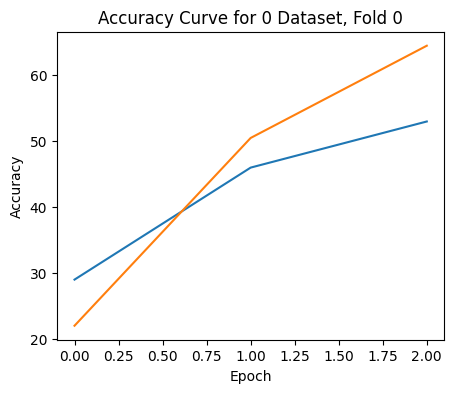

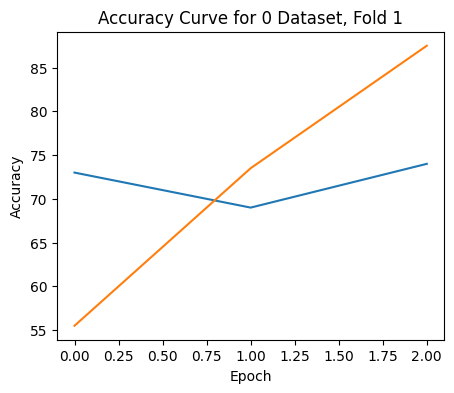

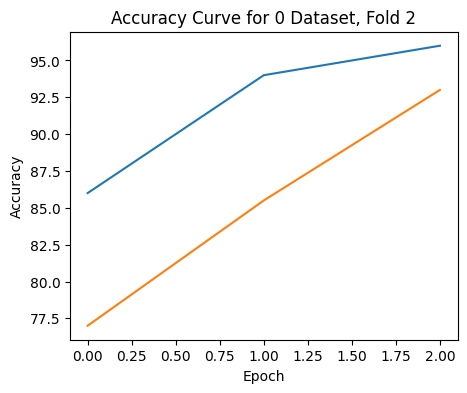

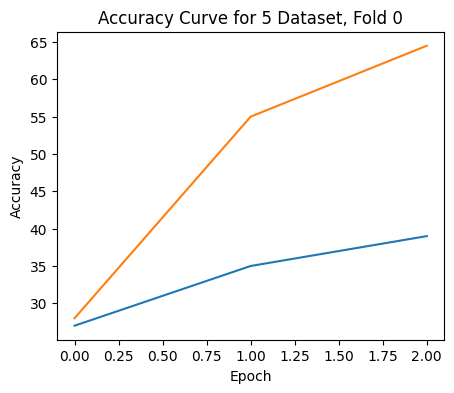

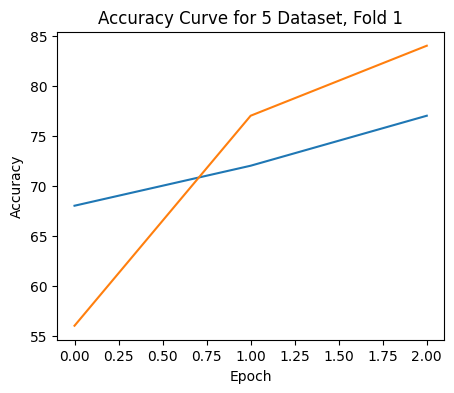

...

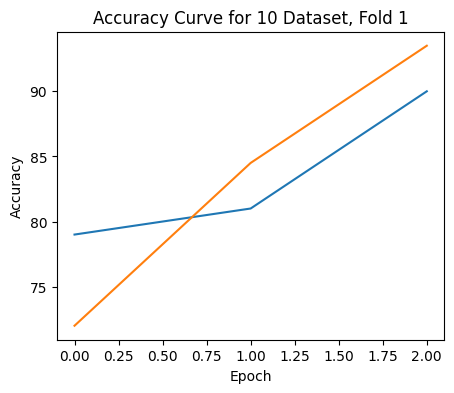

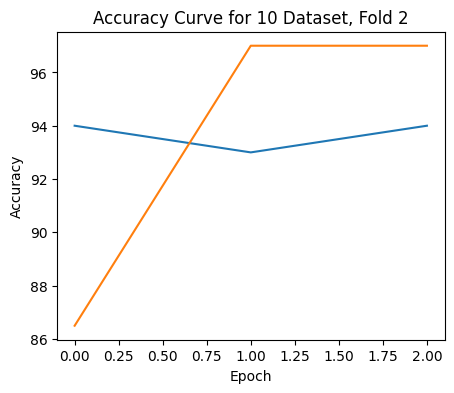

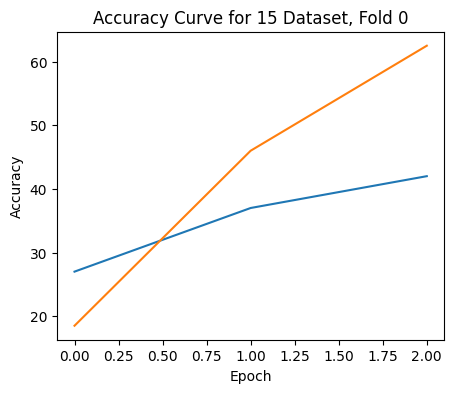

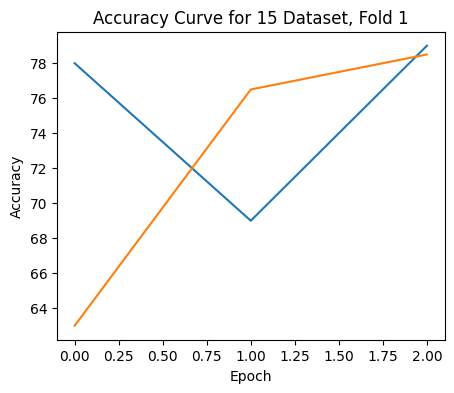

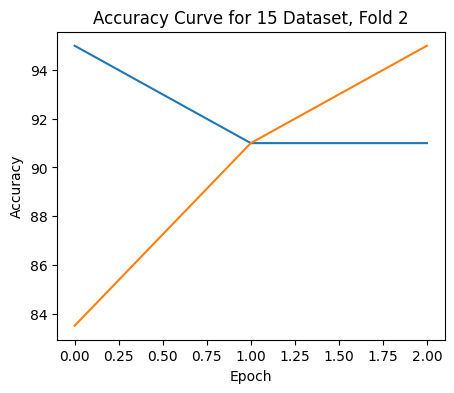

In [13]:
class Attention(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.attention = nn.Sequential(
            nn.Linear(in_features, in_features),
            nn.Tanh(),
            nn.Linear(in_features, 1),
            nn.Softmax(dim=1)
        )

    def forward(self, x):
        return self.attention(x) * x

class CustomCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.fc1 = nn.Linear(64 * 56 * 56, 1000) 
        self.attention = Attention(1000)
        self.fc2 = nn.Linear(1000, 5) 

    def forward(self, x):
        x = F.max_pool2d(F.relu(self.conv1(x)), 2)
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        x = x.view(x.size(0), -1) 
        x = F.relu(self.fc1(x))
        x = self.attention(x)
        return self.fc2(x)

model_CustomCNN = CustomCNN()
run_label_classification_one_vs_rest_fold(model_CustomCNN, 'CustomCNN', 0, 5)


# Training the Model with Pytorch

This script loads a custom animal image dataset using PyTorch's `ImageFolder` class and applies transformations such as resizing, cropping, normalization, and converting to tensors. It then randomly splits the dataset into training and testing sets with a specified ratio. Data loaders are created for both the training and testing sets, specifying batch sizes and whether to shuffle the data during training. The final output reports the sizes of the training and testing sets.

In [14]:
import torch
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch
import torchvision
import torchvision.transforms as transforms

dataset_path = '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals'

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

full_dataset = ImageFolder(root=dataset_path, transform=transform)

train_ratio = 0.8
test_ratio = 1 - train_ratio

train_size = int(train_ratio * len(full_dataset))
test_size = len(full_dataset) - train_size

training_set, testing_set = torch.utils.data.random_split(full_dataset, [train_size, test_size])


training_loader = torch.utils.data.DataLoader(training_set, batch_size=4, shuffle=True, num_workers=2)
testing_loader = torch.utils.data.DataLoader(testing_set, batch_size=4, shuffle=False, num_workers=2)

print('Training set has {} instances'.format(len(training_set)))
print('Testing set has {} instances'.format(len(testing_set)))

Training set has 4320 instances
Testing set has 1080 instances


### Visualziing the data as a sanity check

This script utilizes Matplotlib and PyTorch's torchvision to visualize a batch of images from the training loader. It defines a helper function `matplotlib_imshow` for displaying images. The training loader is iterated to obtain a batch, and a grid of images is created using `torchvision.utils.make_grid`. The `matplotlib_imshow` function is then used to display the image grid, and the corresponding labels are printed based on the batch. The labels are retrieved from a file containing the names of the animals in the dataset.

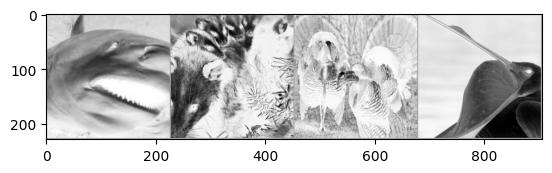

shark  possum  turkey  pelecaniformes


In [15]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
import torchvision.transforms as transforms

def matplotlib_imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))

dataiter = iter(training_loader)
images, labels = next(dataiter)

with open("/kaggle/input/animal-image-dataset-90-different-animals/name of the animals.txt", 'r') as f:
    classes = f.read().splitlines()

classes = tuple(classes)

img_grid = torchvision.utils.make_grid(images)
matplotlib_imshow(img_grid, one_channel=True)
plt.show()

print('  '.join(classes[labels[j]] for j in range(4)))


# The Model

The code defines a simple neural network model called `AnimalClassifier` for image classification. It consists of convolutional (`conv1`, `conv2`) and fully connected (`fc1`, `fc2`, `fc3`) layers with ReLU activation functions. The `forward` method outlines the data flow through the layers. An instance of the model is created as `model`.

In [16]:
import torch.nn as nn
import torch.nn.functional as F

class AnimalClassifier(nn.Module):
    def __init__(self):
        super(AnimalClassifier, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)  
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 53 * 53, 120)  
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 90)
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 53 * 53)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

model = AnimalClassifier()

# Loss Function

Here, I used a cross-entropy loss. For demonstration purposes, I created batches of dummy output and label values, run them through the loss function, and examine the result.

In [17]:
import torch

num_classes = 90

batch_size = 8

dummy_outputs = torch.randn(batch_size, num_classes)
dummy_labels = torch.randint(0, num_classes, (batch_size,))

print("Model Predictions:")
print(dummy_outputs)
print("\nActual Labels:")
print(dummy_labels)

loss_fn = torch.nn.CrossEntropyLoss()

loss = loss_fn(dummy_outputs, dummy_labels)
print('\nTotal loss for this batch: {:.4f}'.format(loss.item()))


Model Predictions:
tensor([[ 0.9279, -0.2765, -0.2813,  0.7971,  0.6869, -0.7703, -0.9259, -1.7323,
          0.5188,  0.0324, -0.3067, -2.4755,  0.6536, -0.3826, -2.7452,  0.7220,
          1.1807,  0.0701, -0.3629, -0.8731, -0.0414,  0.9057,  0.1481,  0.5225,
         -0.5638,  0.5884,  0.6502, -0.8739, -1.0649,  0.0396,  0.8562,  1.1196,
          0.0163,  0.5169,  0.4230,  0.4661, -0.1702,  0.0594,  0.1036, -0.1281,
          0.3707, -0.2161, -0.5264,  0.8792,  2.1216,  0.0200, -1.6721,  1.0020,
          0.0911, -1.4912, -1.4168, -0.7893,  0.9338, -0.9918,  0.0523, -0.2644,
          1.4553, -0.6474,  0.8014, -0.5761,  0.9284, -1.0390, -1.3765, -1.1971,
         -0.1267,  0.0743,  1.1091,  0.3493, -0.6948,  0.5758, -0.4903,  0.4977,
         -1.2665, -0.1386, -0.6014, -1.2371,  1.1130, -0.1043, -0.2924,  0.5600,
         -0.0848, -1.6381,  0.6421,  1.6655, -0.2935,  0.0344, -1.7639,  0.0244,
          0.0941, -1.0777],
        [-0.5783,  1.7482,  0.7193, -0.6161,  0.7924, -1.0603,

#### Optimizer

In [18]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Training Loop

The code executes a training loop for 20 epochs. In each iteration, it processes batches of data from the DataLoader, involving the following steps:
* Fetching a training batch from the DataLoader
* Resetting the optimizer's gradients to zero
* Performing inference by obtaining predictions from the model for the input batch
* Calculating the loss between the predictions and actual labels
* Computing backward gradients with respect to the model's weights
* Instructing the optimizer to adjust the model's weights based on the observed gradients
* Reporting the training loss every 1000 batches
* Finally, it reports the average per-batch loss for the last 1000 batches for comparison with a validation run. The training loop also logs the training and validation losses for visualization using a SummaryWriter. The best model based on validation loss is saved, and the loop concludes by closing the SummaryWriter.

In [19]:
import os
import torch
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter()

EPOCHS = 20
best_vloss = float('inf')

os.makedirs('weights', exist_ok=True)
os.makedirs('epochs', exist_ok=True)

for epoch in range(EPOCHS):
    print('EPOCH {}:'.format(epoch + 1))
    
    model.train(True)
    running_loss = 0.

    for i, data in enumerate(training_loader):
        inputs, labels = data
        
        optimizer.zero_grad()
        
        outputs = model(inputs)

        loss = loss_fn(outputs, labels)
        loss.backward()

        optimizer.step()

        running_loss += loss.item()
        if i % 1000 == 999:
            batch_loss = running_loss / 1000  # loss per batch
            print('  batch {} loss: {}'.format(i + 1, batch_loss))
            running_loss = 0.

    model.train(False)

    running_vloss = 0.0
    for i, vdata in enumerate(testing_loader):
        vinputs, vlabels = vdata
        voutputs = model(vinputs)
        vloss = loss_fn(voutputs, vlabels)
        running_vloss += vloss

    avg_loss = running_loss / (i + 1)
    avg_vloss = running_vloss / (i + 1)
    print('LOSS train {} valid {}'.format(avg_loss, avg_vloss))

    writer.add_scalars('Training vs. Validation Loss',
                       {'Training': avg_loss, 'Validation': avg_vloss},
                       epoch + 1)
    writer.flush()

    if avg_vloss < best_vloss:
        best_vloss = avg_vloss
        
        weight_path = os.path.join('weights', 'animal_model_epoch_{}.pth'.format(epoch + 1))
        torch.save(model.state_dict(), weight_path)
        
        epoch_path = os.path.join('epochs', 'animal_model_epoch_{}.pth'.format(epoch + 1))
        torch.save(model, epoch_path)

writer.close()

2024-03-01 13:10:20.353804: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-01 13:10:20.353903: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-01 13:10:20.527146: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


EPOCH 1:
  batch 1000 loss: 4.460470906496048
LOSS train 1.2955767410772818 valid 4.335941314697266
EPOCH 2:
  batch 1000 loss: 4.302937694311142
LOSS train 1.23214052606512 valid 4.230696201324463
EPOCH 3:
  batch 1000 loss: 4.093096921443939
LOSS train 1.1968370967441135 valid 4.160871505737305
EPOCH 4:
  batch 1000 loss: 3.9064743183851243
LOSS train 1.1607904769756177 valid 4.076669216156006
EPOCH 5:
  batch 1000 loss: 3.6609809914827345
LOSS train 1.0486567461932148 valid 3.8348171710968018
EPOCH 6:
  batch 1000 loss: 3.099481548666954
LOSS train 0.9359475572903951 valid 3.809035062789917
EPOCH 7:
  batch 1000 loss: 2.3073456092327835
LOSS train 0.7367992652787103 valid 3.8048927783966064
EPOCH 8:
  batch 1000 loss: 1.5791818229332566
LOSS train 0.44629323029959644 valid 4.745338439941406
EPOCH 9:
  batch 1000 loss: 1.149665664555272
LOSS train 0.36675354773523633 valid 4.9351372718811035
EPOCH 10:
  batch 1000 loss: 0.6902455049738201
LOSS train 0.27153127536401844 valid 5.096276

# Convolutional Layer Visualization
The provided code is for visualizing the output feature maps of selected convolutional layers in a trained neural network. This process provides insight into how the model processes input images at different convolutional layers, aiding in understanding the hierarchical feature extraction within the neural network.

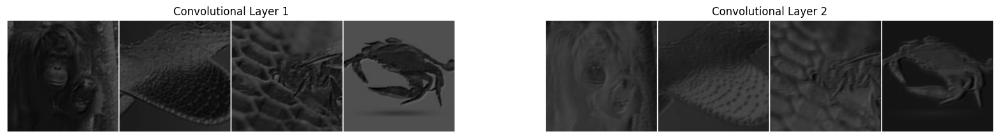

In [27]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder

def matplotlib_imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5     
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))


transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

full_dataset = ImageFolder(root=dataset_path, transform=transform)


visualization_loader = torch.utils.data.DataLoader(full_dataset, batch_size=4, shuffle=True, num_workers=2)

model = AnimalClassifier()
model = torch.load('/kaggle/working/epochs/animal_model_epoch_6.pth')


conv_layers = [model.conv1, model.conv2]

images, labels = next(iter(visualization_loader))

outputs = []
for layer in conv_layers:
    images = layer(images)
    outputs.append(images)

fig = plt.figure(figsize=(20, 20))  
for i, feature_map in enumerate(outputs):
    plt.subplot(1, len(outputs), i + 1)
    matplotlib_imshow(torchvision.utils.make_grid(feature_map, normalize=True), one_channel=True)
    plt.title(f'Convolutional Layer {i + 1}')
    plt.axis('off')

plt.show()
